# Redes Neuronales

Para mas detalle sobre el perceptrón simple:

https://www.youtube.com/watch?v=5-ROxtrtLbE&t=994s

- Vimos varias opciones para hacer crecer la topología "A lo ancho": regresión polinomial, SVM.
- Las redes neuronales son una alternativa, y se caracterizan por ser modelos que crecen en profundidad.
- El elemento constitutivo de una red neuronal, es la neurona, y en general tiene la forma:

<img src="perceptrón.png">

Este modelo está inspirado en el funcionamiento biológico de una neurona:

<img src="neuronasf.jpg">

La función de activación simula la activación neuronal. En nuestro caso, esta función debe ser derivable para poder utilizar los métodos de aprendizaje vistos anteriormente.

## Función de costo

Si la red neuronal será utilizada como un clasificador:
- binary crossentropy o softmax crossentropy.

Si la red neuronal será utilizada como un regresor:
- MSE

## Optimizadores:

- Todos los vistos anteriormente. Veamos un ejemplo de su aplicación mediante el algoritmo de backpropagation.

La demostración es larga pero sencilla, por lo que está en video por si quieren reproducir la explicación de clase.

### Algoritmo de backpropagation:

https://www.youtube.com/watch?v=zMEUQbN0-l4&t=55s

<img src="regla_cadena.png">

De esta manera, se pueden aplicar distintas capas (no solo la fully connected) en la medida de que la función de costo de la red sea derivable con respecto a sus parámetros. Tal es el caso de las distintas capas que veremos a lo largo del curso: CNNs, Simple RNN, GRU, LSTM, etc.

# Implementación en Keras

Implementemos en Keras el problema de clasificacíón de chips y analicemos los resultados

# Discusión

¿Cómo sería la propagación del error en una red con topología tipo U (conexiones residuales)?

In [5]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
from IPython.display import HTML
import MLP_helper as MLPHelper
from fnn_helper import PlotLosses
from keras import optimizers
from keras import backend as K
from matplotlib import pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import numpy as np
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
y_train = np.load('y_train.npy') 
y_test = np.load('y_test.npy')

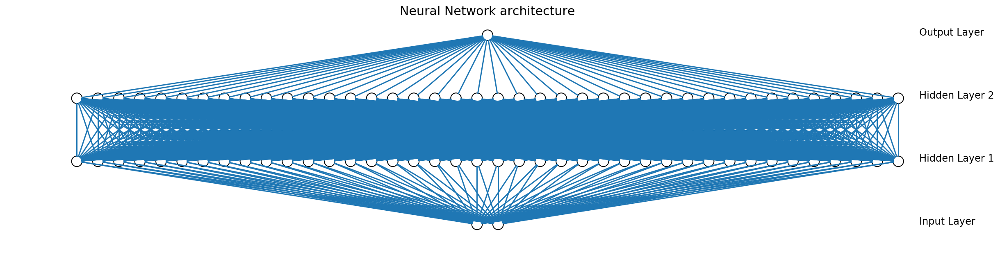

In [7]:
import draw_nn
input_shape = 2
hidden_units = [40,40]
output_size = 1
network = draw_nn.DrawNN( [input_shape] + hidden_units + [output_size] )
network.draw()

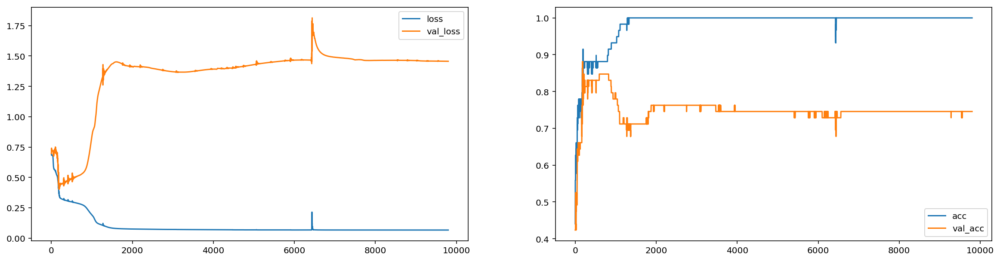

In [14]:
epochs = 10000 #adam 3000, sgd 30000
lr=1
decay=0
optim = optimizers.sgd(lr=1, decay=0, momentum=0) # cambiar a momentum 0.9 y lr a 5
batch_size = 59 # 10 y 59

optim = optimizers.adam(lr=0.01, decay=0.0001)
# optim = optimizers.rmsprop(lr=0.01, decay=0.001)

plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
model, _ = MLPHelper.get_n_layer_model_L2(input_shape, 
                                                 output_size, 
                                                 hidden_units=hidden_units, 
                                                 lr=lr, 
                                                 l2_lambda=0.0001, 
                                                 decay=decay,
                                                 optim = optim,
                                                )
model.fit(X_train, 
          y_train, batch_size = batch_size,
          epochs=epochs, 
          verbose=0, 
          validation_data=(X_test, y_test), 
          callbacks=[plot_losses],
         )

59/59 [==============================] - 0s 27us/step
(37240, 1)
59/59 [==============================] - 0s 33us/step
(43888, 1)


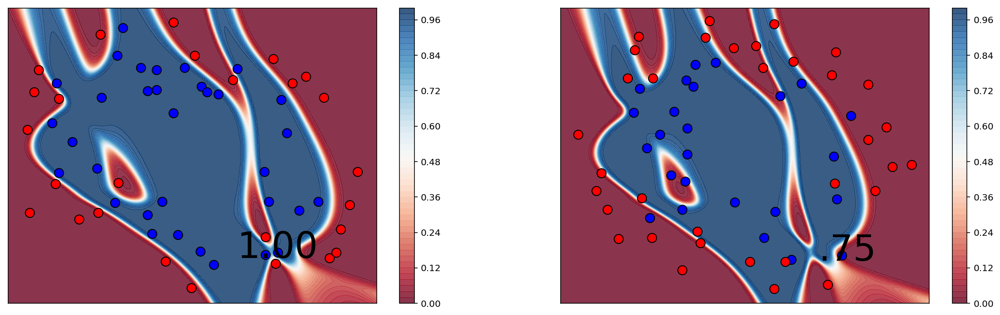

In [15]:
from matplotlib import pyplot as plt
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
MLPHelper.plot_boundaries_keras(X_train, y_train, model.evaluate(X_train, y_train)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
MLPHelper.plot_boundaries_keras(X_test, y_test, model.evaluate(X_test, y_test)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
plt.show()

En principio haber tirado dos capas ocultas de 40 unidades al boleo no parece haber sido una buena idea, ya que vemos que hay overfitting. Esto se ve tanto en el umbral de separación, como en las curvas de aprendizaje. 
El primer paso es uno que ya hemos probado en clase: Regresión Logística.  
¿Qué problemas tenemos con esto?
Agreguemos una capa mas, con dos neuronas ocultas:

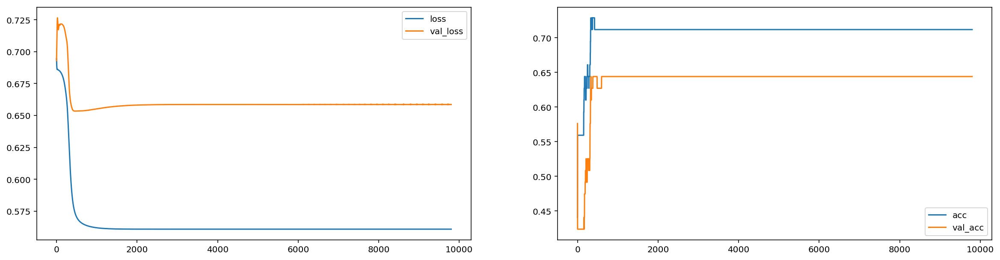

In [18]:
input_shape = 2
hidden_units = [2]
output_size = 1
network = draw_nn.DrawNN( [input_shape] + hidden_units + [output_size] )
network.draw()
plt.plot()
epochs = 10000 #adam 3000, sgd 30000
lr=1
decay=0
optim = optimizers.sgd(lr=1, decay=0, momentum=0) # cambiar a momentum 0.9 y lr a 5
batch_size = 59 # 10 y 59

optim = optimizers.adam(lr=0.01, decay=0.0001)
# optim = optimizers.rmsprop(lr=0.01, decay=0.001)

plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
model,_ = MLPHelper.get_n_layer_model_L2(input_shape, 
                                                 output_size, 
                                                 hidden_units=hidden_units, 
                                                 lr=lr, 
                                                 l2_lambda=0.0001, 
                                                 decay=decay,
                                                 optim = optim,
                                                 activation='sigmoid'
                                                )
model.fit(X_train, 
          y_train, batch_size = batch_size,
          epochs=epochs, 
          verbose=0, 
          validation_data=(X_test, y_test), 
          callbacks=[plot_losses],
         )

59/59 [==============================] - 0s 22us/step
(37240, 1)
59/59 [==============================] - 0s 22us/step
(43888, 1)


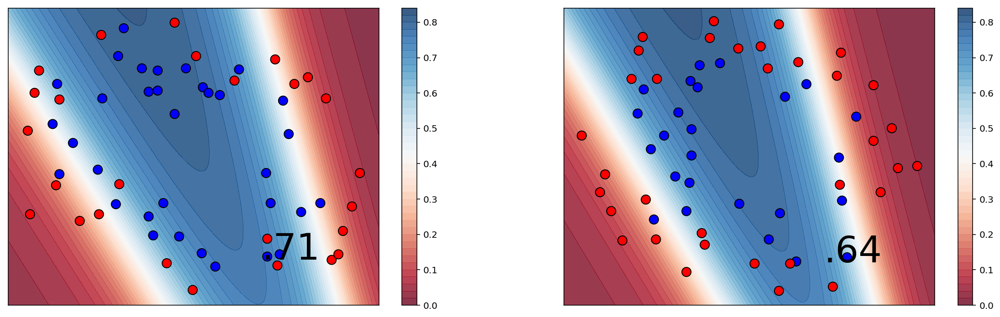

In [19]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
MLPHelper.plot_boundaries_keras(X_train, y_train, model.evaluate(X_train, y_train)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
MLPHelper.plot_boundaries_keras(X_test, y_test, model.evaluate(X_test, y_test)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
plt.show()

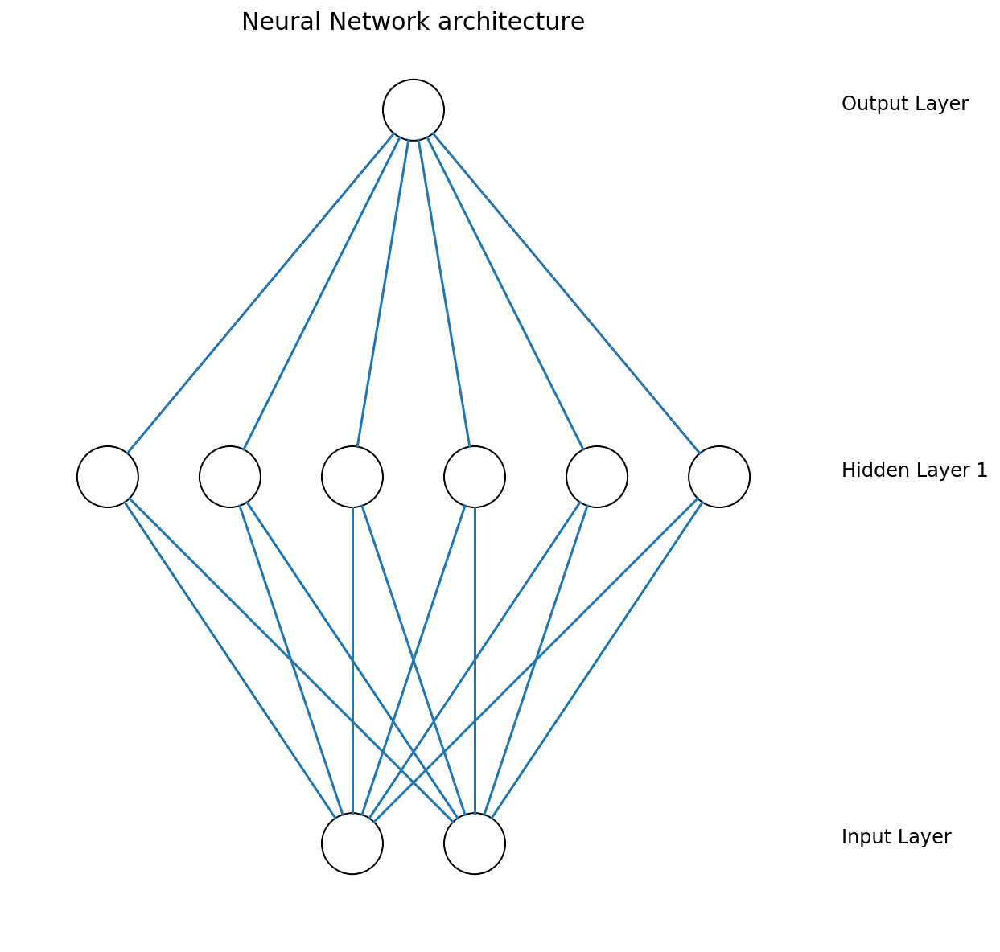

In [20]:
input_shape = 2
hidden_units = [6]
output_size = 1
network = draw_nn.DrawNN( [input_shape] + hidden_units + [output_size] )
network.draw()

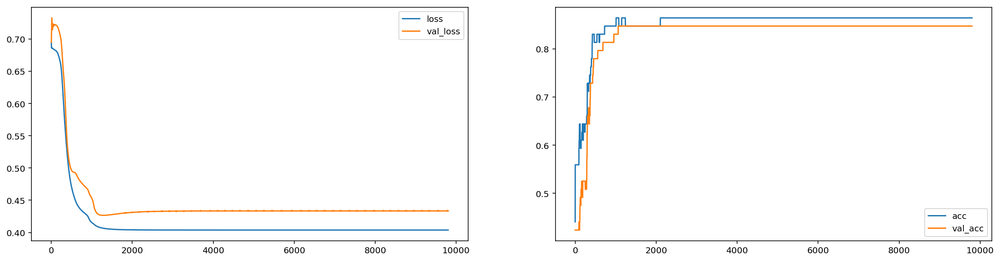

59/59 [==============================] - 0s 30us/step
(37240, 1)
59/59 [==============================] - 0s 24us/step
(43888, 1)


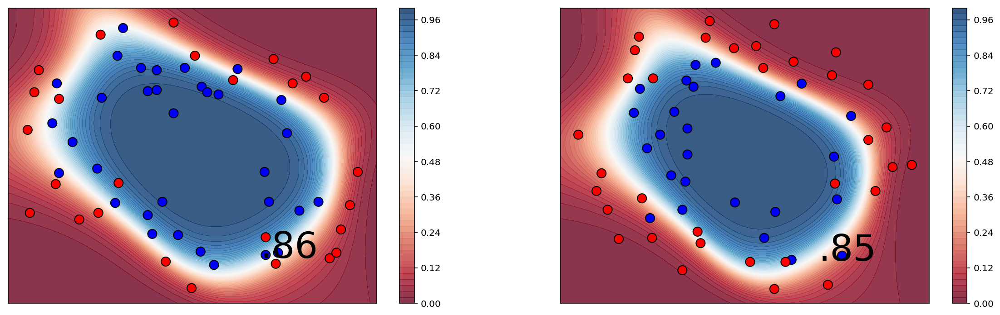

In [21]:
epochs = 10000 #adam 3000, sgd 30000
lr=1
decay=0
optim = optimizers.sgd(lr=1, decay=0, momentum=0) # cambiar a momentum 0.9 y lr a 5
batch_size = 59 # 10 y 59

optim = optimizers.adam(lr=0.01, decay=0.0001)
# optim = optimizers.rmsprop(lr=0.01, decay=0.001)

plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
two_layer_model,_ = MLPHelper.get_n_layer_model_L2(input_shape, 
                                                 output_size, 
                                                 hidden_units=hidden_units, 
                                                 lr=lr, 
                                                 l2_lambda=0.0001, 
                                                 decay=decay,
                                                 optim = optim,
                                                 activation='sigmoid'
                                                )
two_layer_model.fit(X_train, 
          y_train, batch_size = batch_size,
          epochs=epochs, 
          verbose=0, 
          validation_data=(X_test, y_test), 
          callbacks=[plot_losses],
         )
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
MLPHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
MLPHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
plt.show()

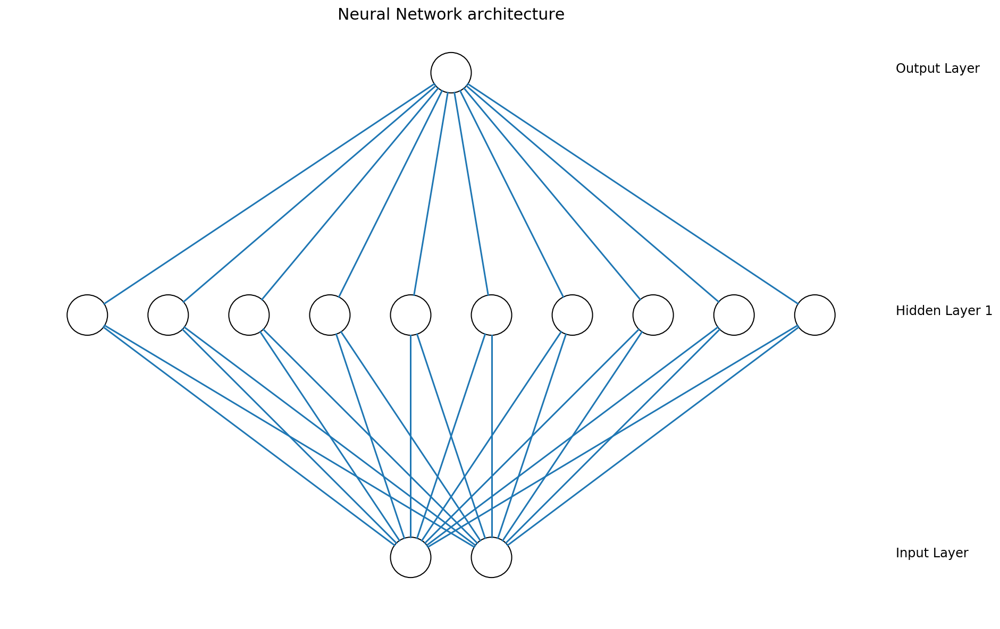

In [22]:
input_shape = 2
hidden_units = [10]
output_size = 1
network = draw_nn.DrawNN( [input_shape] + hidden_units + [output_size] )
network.draw()


In [23]:
def aux(hidden_units,activation='sigmoid',l2_lambda=0,dropout=0.0,epochs=10000,tensorboard=False,logdir="./logs"):
    input_shape = 2
    output_size = 1
    lr=1
    decay=0
    optim = optimizers.sgd(lr=1, decay=0, momentum=0) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59

    optim = optimizers.adam(lr=0.01, decay=0.0001)

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    model,callbackTB = MLPHelper.get_n_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     tensorboard=tensorboard, 
                                                     logdir=logdir,
                                                     dropout=dropout
                                                    )
    if(tensorboard):
        model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[plot_losses,callbackTB],
             )
    else:
        model.fit(X_train, 
                  y_train, batch_size = batch_size,
                  epochs=epochs, 
                  verbose=0, 
                  validation_data=(X_test, y_test), 
                  callbacks=[plot_losses],
                 )
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    MLPHelper.plot_boundaries_keras(X_train, y_train, model.evaluate(X_train, y_train)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    MLPHelper.plot_boundaries_keras(X_test, y_test, model.evaluate(X_test, y_test)[1], model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
    plt.show()


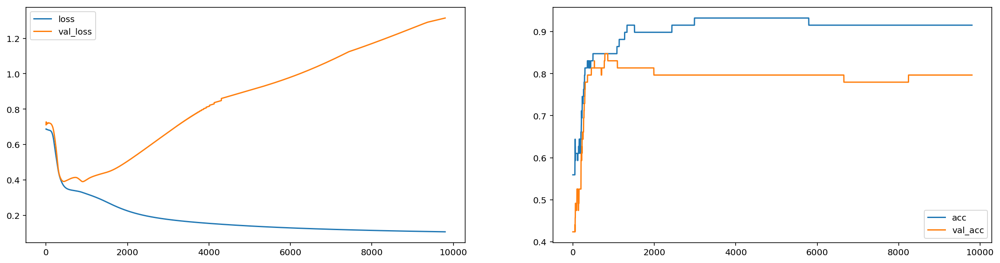

59/59 [==============================] - 0s 39us/step
(37240, 1)
59/59 [==============================] - 0s 25us/step
(43888, 1)


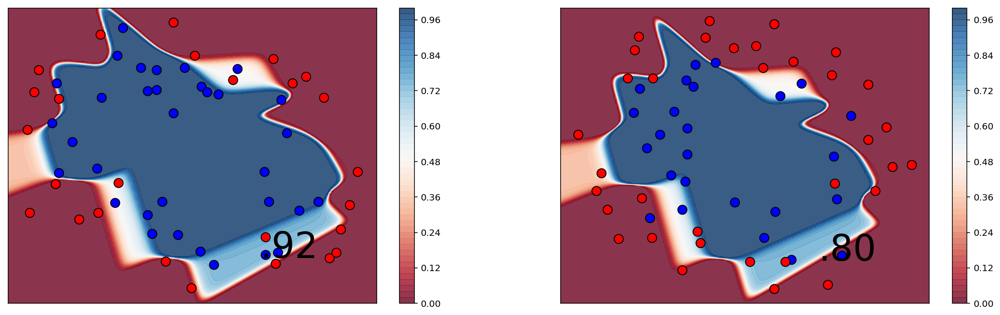

In [24]:
aux([10])

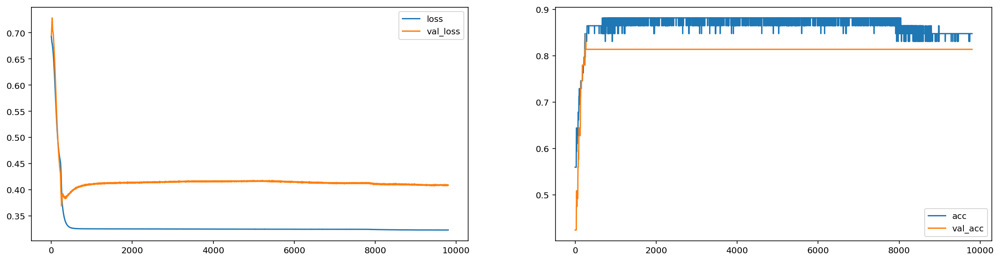

59/59 [==============================] - 0s 25us/step
(37240, 1)
59/59 [==============================] - 0s 24us/step
(43888, 1)


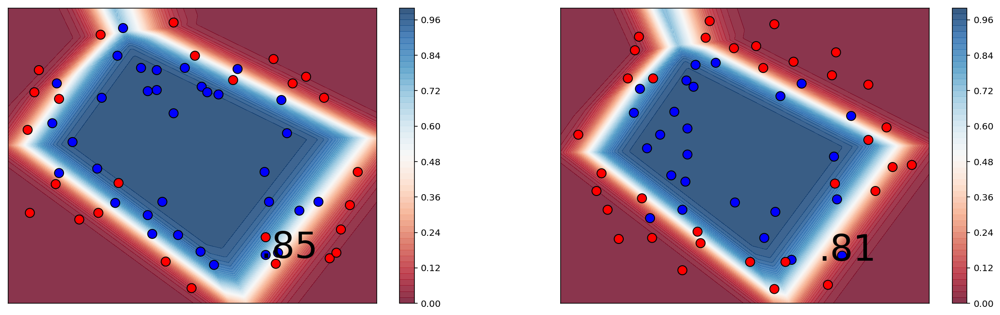

In [26]:
# Si se prueba varias veces esta línea, se tienen resultados muy distintos. Eso deja claro la importancia de la inicialización de pesos
aux([10],'relu') #Se nota el overfitting, la función de activación relu da mas grados de libertad que una sigmoidea

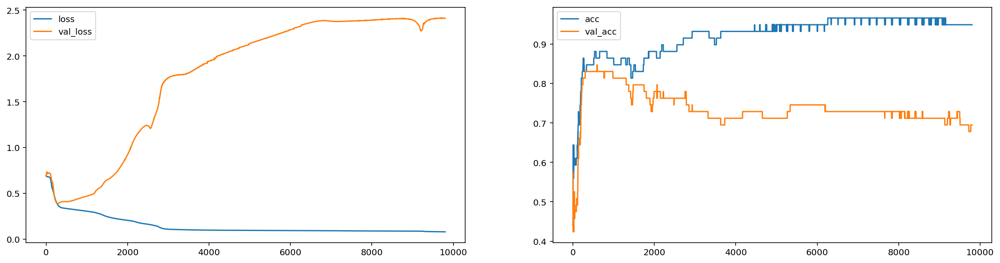

59/59 [==============================] - 0s 30us/step
(37240, 1)
59/59 [==============================] - 0s 25us/step
(43888, 1)


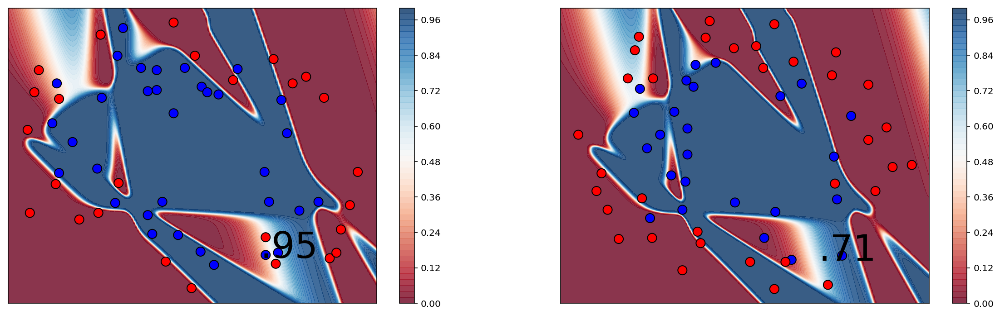

In [27]:
aux([10],'tanh')

En general para las capas intermedias se utilizan tanh o relu. Sin embargo, para algunas aplicaciones particulares son de interés otras funciones de activación, como la leaky relu.

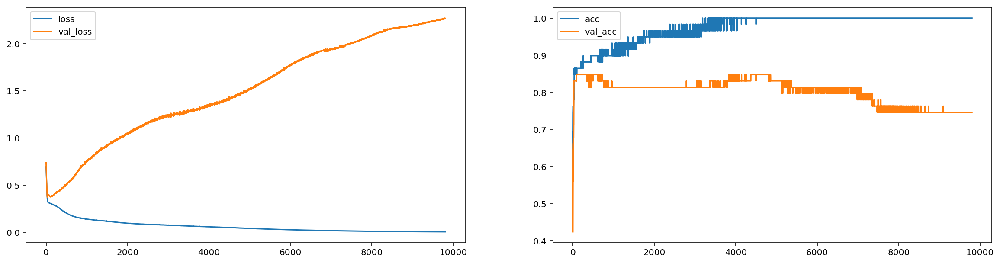

59/59 [==============================] - 0s 40us/step
(37240, 1)
59/59 [==============================] - 0s 25us/step
(43888, 1)


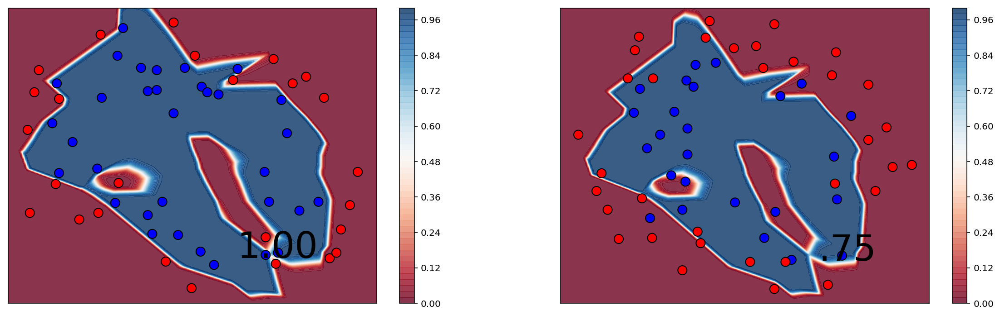

In [28]:
aux([1000],'relu')

Hasta ahora hemos visto ejemplos de umbrales para redes neuronales de una capa oculta. Agreguemos una capa mas.

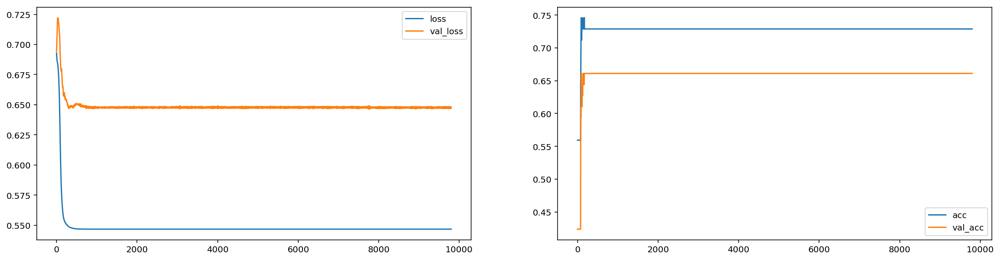

59/59 [==============================] - 0s 41us/step
(37240, 1)
59/59 [==============================] - 0s 29us/step
(43888, 1)


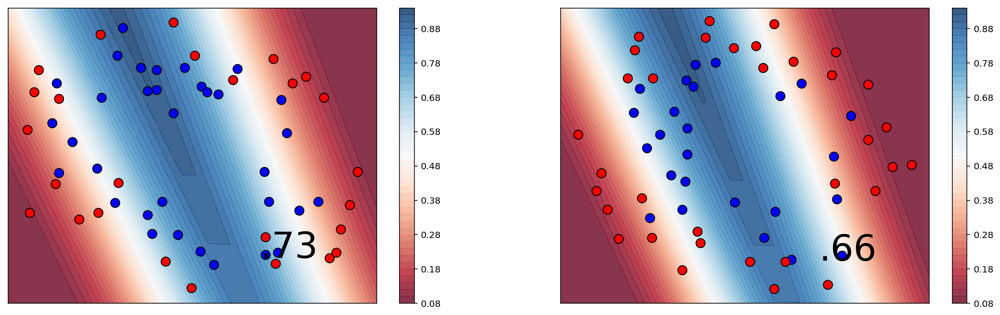

In [29]:
aux([2,2],'relu')

¿Qué pasó acá?

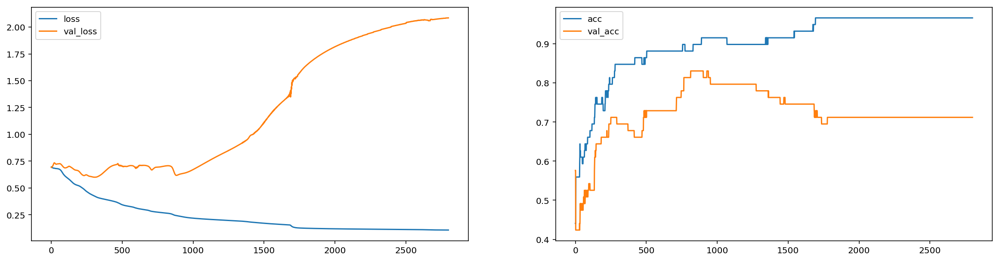

59/59 [==============================] - 0s 31us/step
(37240, 1)
59/59 [==============================] - 0s 26us/step
(43888, 1)


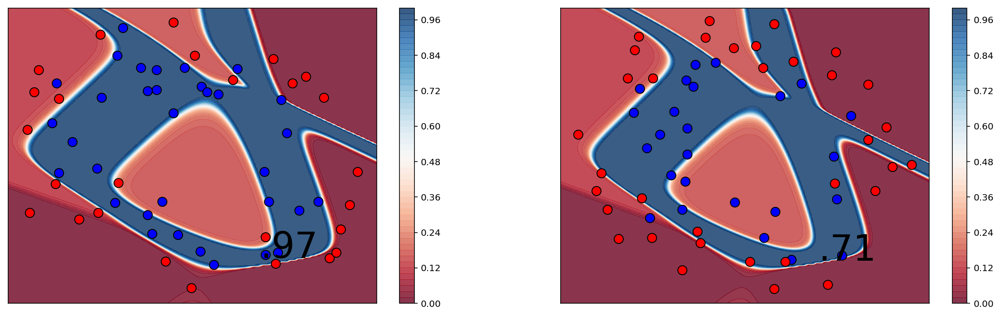

In [35]:
aux([4,4],'tanh',epochs=3000)

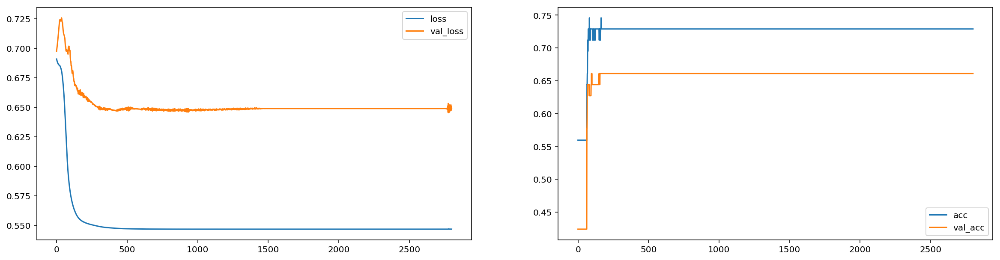

59/59 [==============================] - 0s 38us/step
(37240, 1)
59/59 [==============================] - 0s 32us/step
(43888, 1)


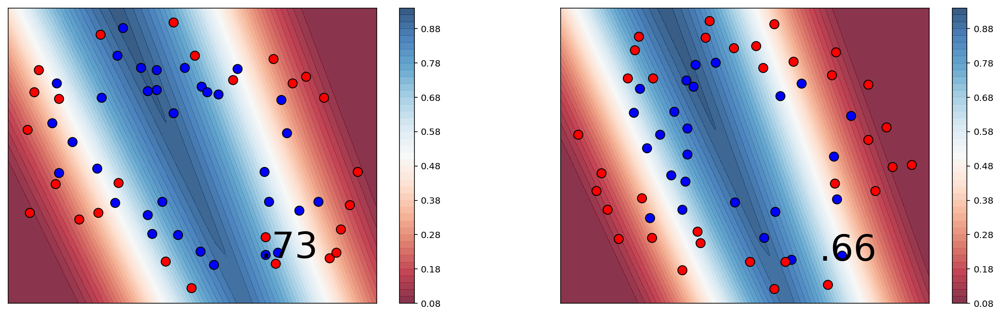

In [31]:
aux([4,4],'relu',epochs=3000)

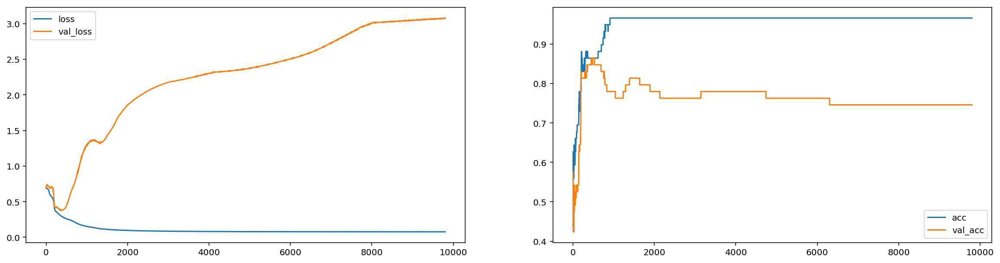

59/59 [==============================] - 0s 25us/step
(37240, 1)
59/59 [==============================] - 0s 26us/step
(43888, 1)


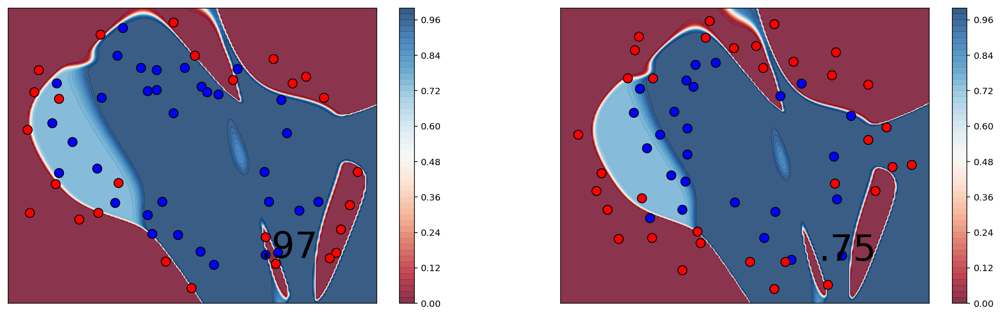

In [32]:
aux([6,6],'tanh',epochs=10000)

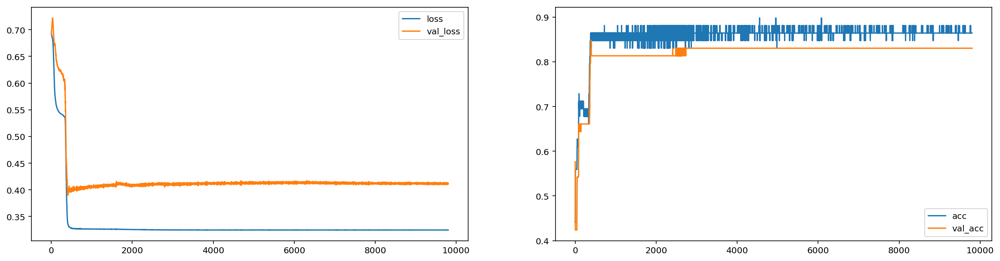

59/59 [==============================] - 0s 34us/step
(37240, 1)
59/59 [==============================] - 0s 26us/step
(43888, 1)


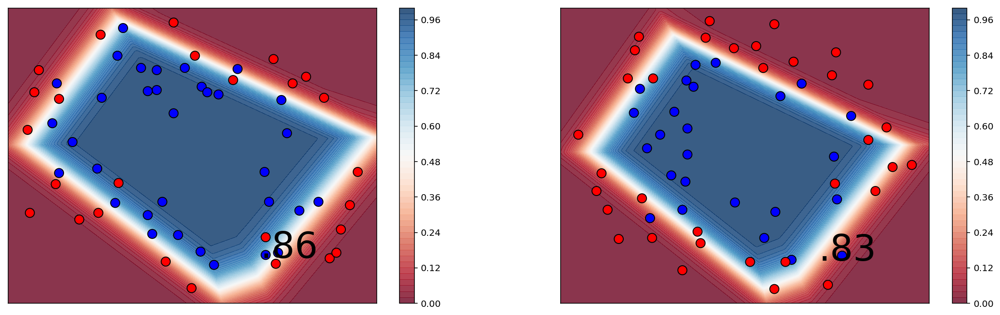

In [33]:
aux([6,6],'relu',epochs=10000)

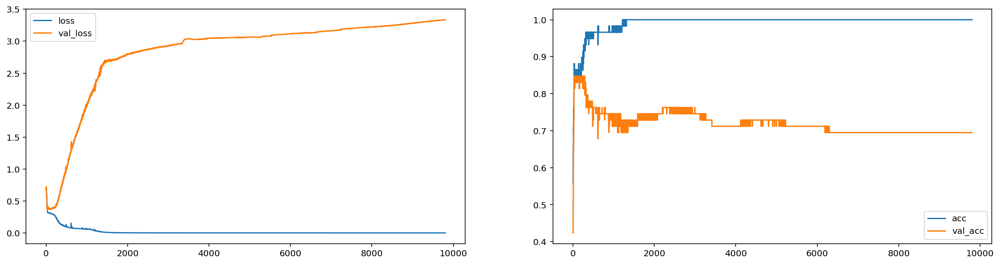

59/59 [==============================] - 0s 39us/step
(37240, 1)
59/59 [==============================] - 0s 29us/step
(43888, 1)


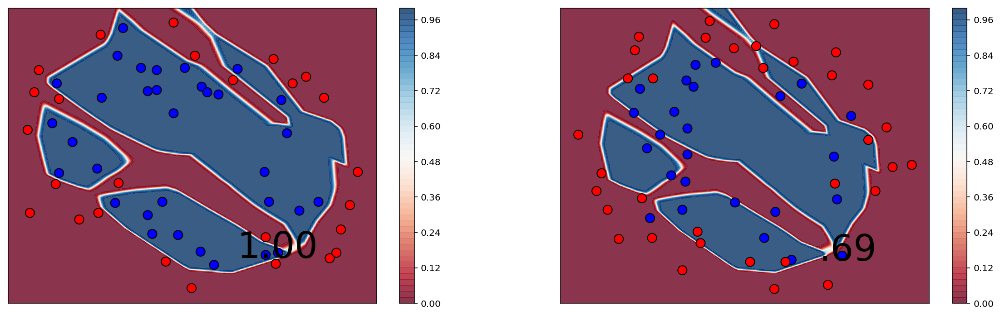

In [34]:
aux([100,100],'relu',epochs=10000)

En general a medida que se van aumentando mas capas la red tiene mas facilidad para hacer secciones que contienen otras secciones. 
<img src="regions.png">
Agreguemos una capa mas, a ver qué pasa con los umbrales de decisión. 

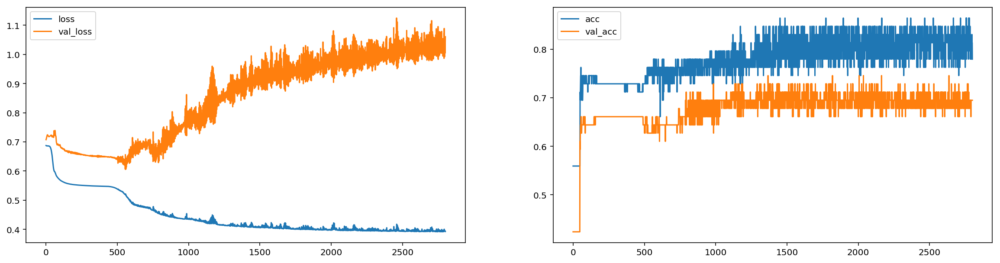

59/59 [==============================] - 0s 31us/step
(37240, 1)
59/59 [==============================] - 0s 28us/step
(43888, 1)


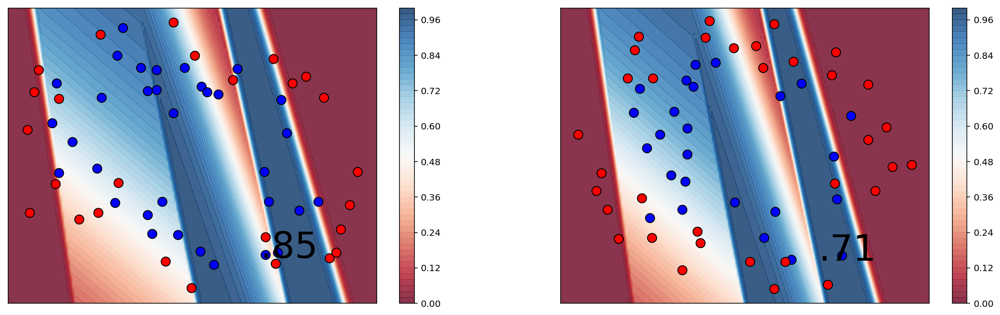

In [36]:
aux([6,6,6],'relu',epochs=3000)

Si comparamos esta última gráfica con la [6,6] parecería que le costara mas aprender, crezcamos una capa mas en profundidad:

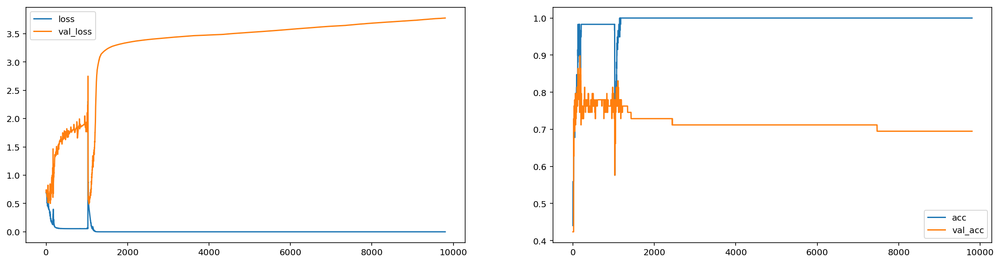

59/59 [==============================] - 0s 30us/step
(37240, 1)
59/59 [==============================] - 0s 30us/step
(43888, 1)


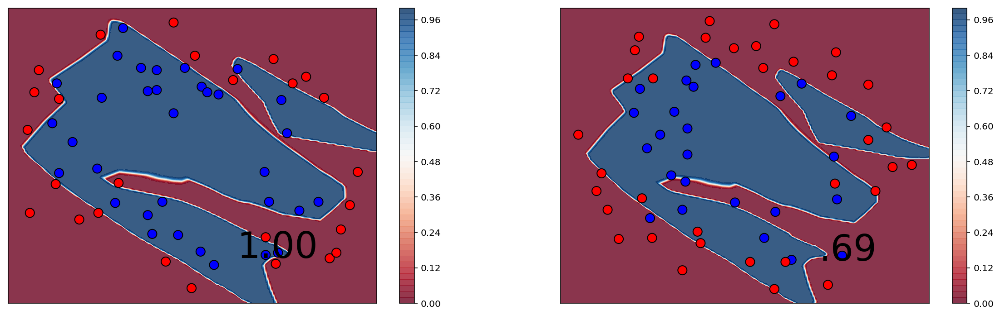

In [37]:
aux([60,60,60,60],'relu',epochs=10000)

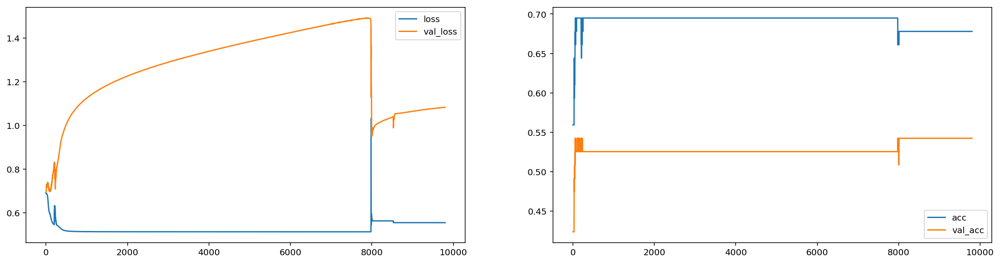

59/59 [==============================] - 0s 36us/step
(37240, 1)
59/59 [==============================] - 0s 26us/step
(43888, 1)


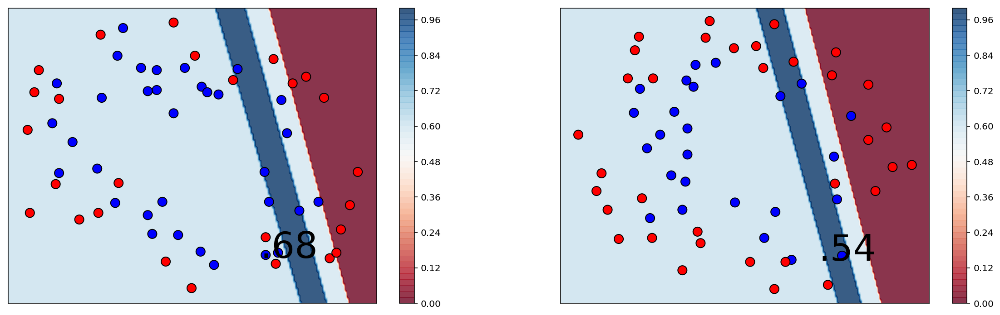

In [38]:
aux([6,6,6,6],'tanh',epochs=10000)

# Tensorboard

En los ejemplos de varias capas, el entrenamiento se vuelve cada vez mas difícil de controlar. Eso se debe a que en la propagación del error en el algoritmo de backpropagation aparecen multiplicando los siguientes factores:

- Derivadas de la función de activación: Valen cero en grandes intervalos de cada función de activación.
- Pesos: los cuales inicialmente pueden tener valores muy chicos.

Por esta razón es útil disponer de alguna herramienta que nos permita ir verificando el comportamiento interno de la red a medida que va avanzando el entrenamiento.
Tensorboard es un callback (como plot losses) que va escribiendo el estado de los pesos, los gradientes y algunas funciones de costo u otras métricas, para ser consultadas desde una interfaz web.

In [ ]:
from keras.callbacks import TensorBoard
callbackTB=TensorBoard(log_dir=logdir, histogram_freq=1000, batch_size=32, write_graph=True, write_grads=True, write_images=True)
# Y en el entrenamiento agregar:
model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[plot_losses, callbackTB],
             )

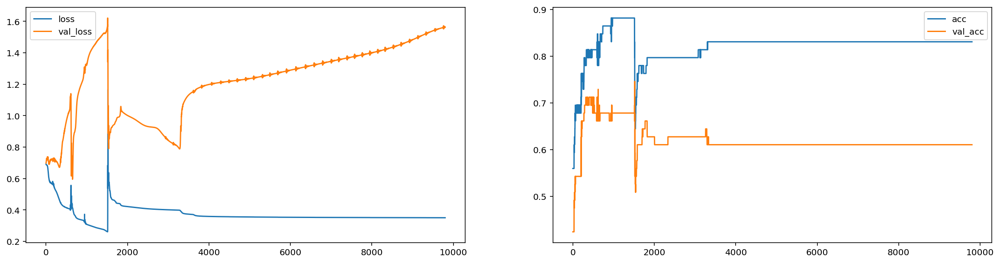

59/59 [==============================] - 0s 50us/step
(37240, 1)
59/59 [==============================] - 0s 32us/step
(43888, 1)


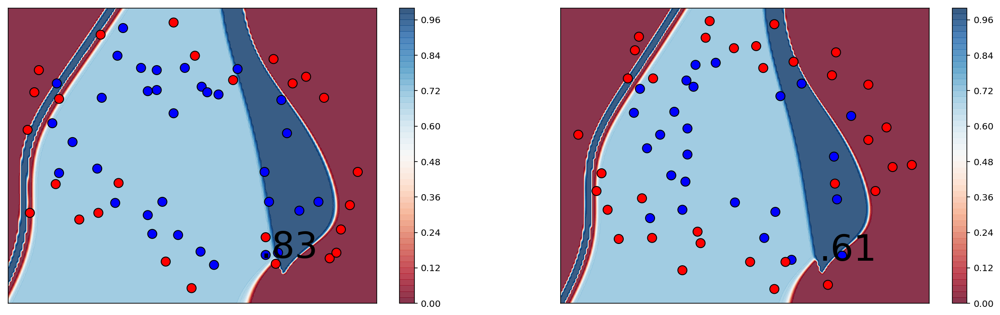

In [40]:
aux([6,6,6,6],'tanh',epochs=10000,tensorboard=True,logdir="./log-6-6-6-6-tanh")

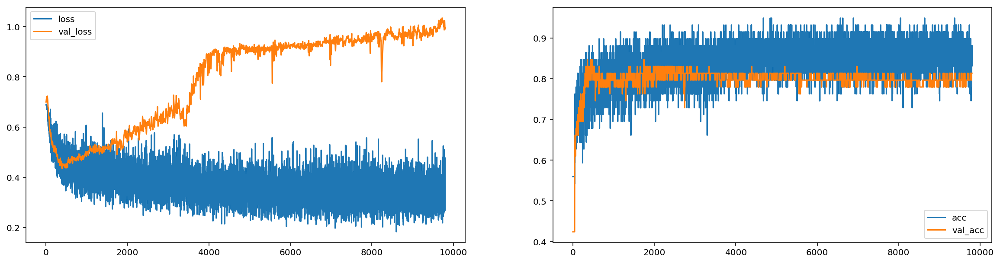

59/59 [==============================] - 0s 20us/step
(37240, 1)
59/59 [==============================] - 0s 23us/step
(43888, 1)


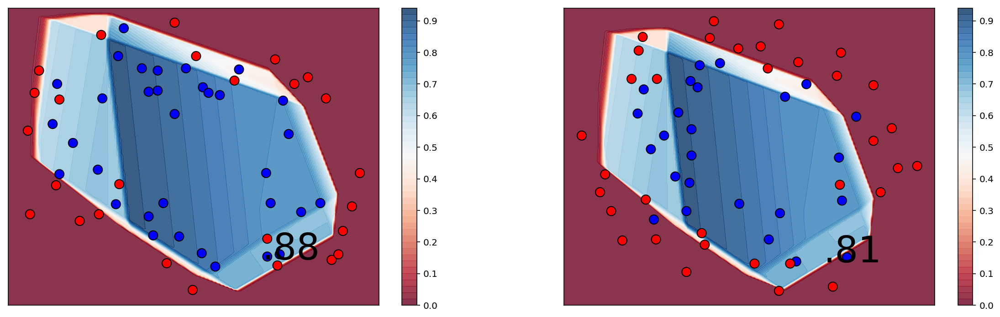

In [42]:
K.clear_session()
aux([10,10],'relu',epochs=10000,tensorboard=True,logdir="./log-10-10-relu",dropout=0.2)

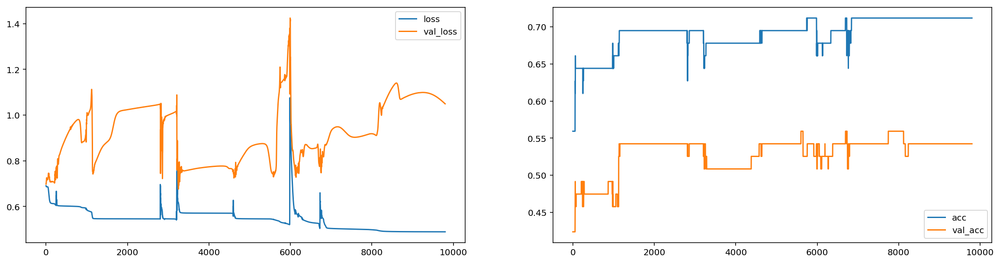

59/59 [==============================] - 0s 22us/step
(37240, 1)
59/59 [==============================] - 0s 23us/step
(43888, 1)


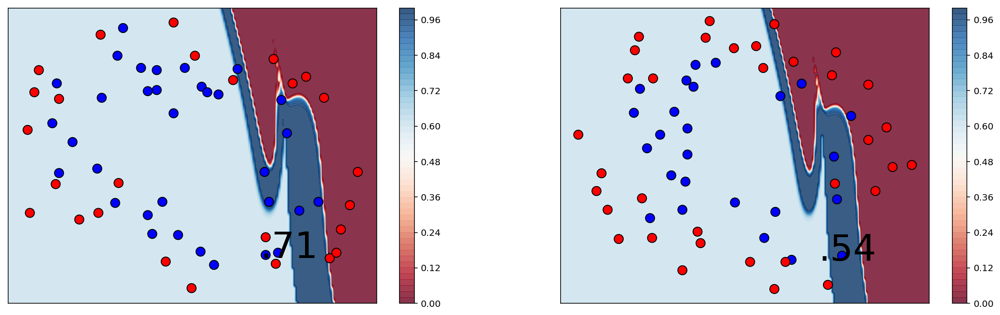

In [43]:
K.clear_session()
aux([4,4,4,4,4],'tanh',epochs=10000,tensorboard=True,logdir="./log-10-10-10-10-tanh")

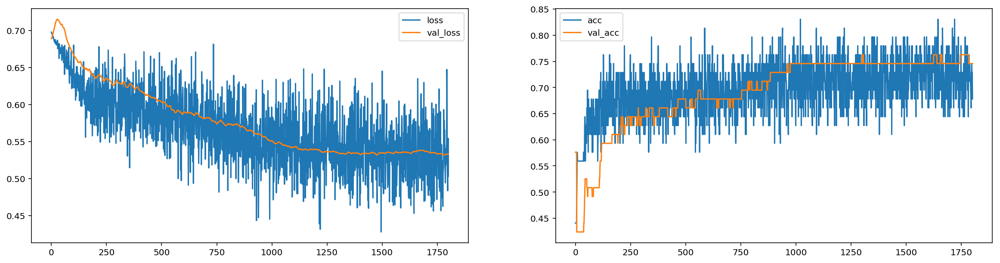

59/59 [==============================] - 0s 45us/step
(250500, 1)
59/59 [==============================] - 0s 48us/step
(250000, 1)


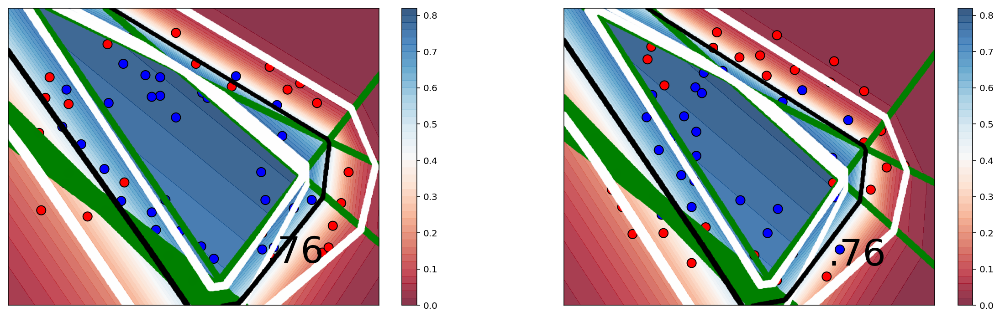

In [129]:
MLPHelper.plot_th_MLP([10,10],epochs=2000,activation='relu',dropout=0.2)

In [63]:
model_val.predict(X_test)

array([[-0.9321704 ,  0.97739744],
       [-0.99031925,  0.6234048 ],
       [-0.6218171 ,  0.9945679 ],
       [-0.9946042 ,  0.78621846],
       [-0.5803895 ,  0.9567994 ],
       [ 0.60890335,  0.99936736],
       [-0.9652556 ,  0.94488776],
       [-0.9667276 ,  0.6390081 ],
       [-0.07203667,  0.9980912 ],
       [-0.1082857 ,  0.9983668 ],
       [-0.26778975,  0.9984889 ],
       [ 0.64204097,  0.9997009 ],
       [-0.9792326 ,  0.89802617],
       [-0.99601555,  0.69234484],
       [-0.9998048 , -0.8495398 ],
       [-0.9933288 ,  0.39713618],
       [-0.9938285 ,  0.12835136],
       [ 0.9231889 ,  0.9998022 ],
       [ 0.8420256 ,  0.99959165],
       [ 0.5068389 ,  0.9994505 ],
       [-0.93780506,  0.7225398 ],
       [-0.9240723 ,  0.9738503 ],
       [-0.9990011 , -0.6303967 ],
       [-0.9998211 , -0.7648234 ],
       [ 0.644402  ,  0.99877864],
       [-0.90617   ,  0.98597115],
       [-0.995858  ,  0.22814079],
       [ 0.15252905,  0.9973497 ],
       [-0.99971235,